In [11]:
import os
import scanpy as sc
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.font_manager as fm
import seaborn as sns
import pickle
from utils import datetime_to_datenum, birth_calculation

# Load files and font

In [12]:
distance_matrix_df = pd.read_parquet('./data/filtered_mutant_ad_mix.parquet')
seqs = distance_matrix_df.index
distance_matrix = distance_matrix_df.values

fontpath = './data/Arial.ttf'
if os.path.exists(fontpath):
    fm.fontManager.addfont(fontpath)

plt.rcParams.update({
    'figure.facecolor': 'white',
    'axes.facecolor': 'white',
    'font.size': 10,
    'lines.linewidth': 1.5,
    'axes.spines.top': True,
    'axes.spines.right': True,
    'xtick.direction': 'out',
    'ytick.direction': 'out',
    'xtick.major.size': 5,
    'ytick.major.size': 5
})
plt.rcParams['font.family'] = 'Arial'
plt.rcParams['pdf.fonttype'] = 42

adata = sc.read('./data/antigenic_adata_clustered.h5ad')
canada_counts_df = pd.read_csv('./data/mutant_counts_by_date_Canada.csv')

cluster_col = 'Representative lineage'
ace2_col = 'ace2_binding'

labels = adata.obs[cluster_col].astype(str).values
unique_labels = sorted(
    adata.obs[cluster_col].astype(str).unique(),
    key=lambda x: int(str(x).split(':')[0])
)

if pd.api.types.is_categorical_dtype(adata.obs[cluster_col]):
    category_order = adata.obs[cluster_col].cat.categories.astype(str).tolist()
else:
    category_order = sorted(adata.obs[cluster_col].astype(str).unique().tolist())

color_key = f'{cluster_col}_colors'
ordered_colors = None
if color_key in adata.uns:
    color_map = dict(zip(category_order, adata.uns[color_key]))
    ordered_colors = [color_map[label] for label in unique_labels if label in color_map]


/home/jkc/miniconda3/envs/Abmodel/lib/python3.10/site-packages/anndata/_core/aligned_df.py:68: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)
/tmp/ipykernel_2229950/2369809196.py:36: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(adata.obs[cluster_col]):


# Antigenic map and clusters

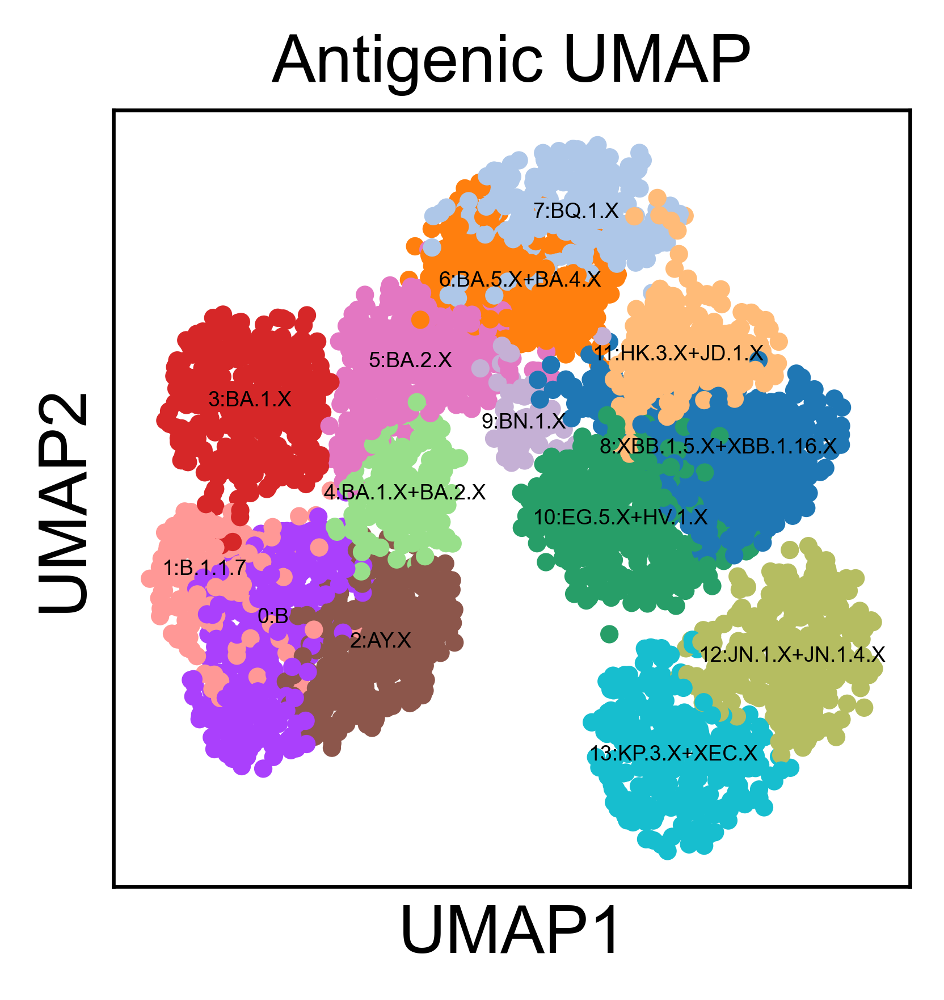

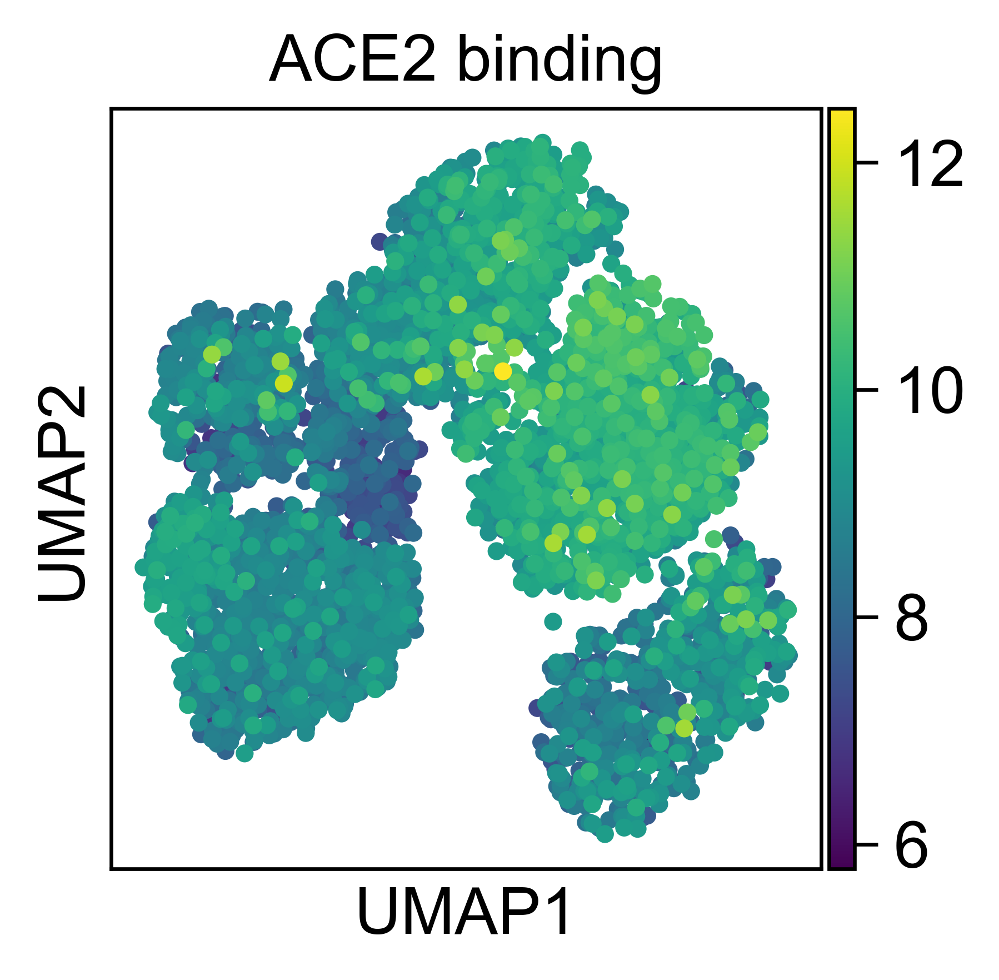

In [13]:
sc.set_figure_params(figsize=(3, 3), dpi=300)

sc.pl.umap(
    adata,
    color=cluster_col,
    title='Antigenic UMAP',
    legend_loc='on data',
    legend_fontsize=4.5,
    size=60
)

sc.pl.umap(
    adata,
    color=ace2_col,
    title='ACE2 binding',
    size=60
)


# Cluster-level distance matrix and ace2-binding

/tmp/ipykernel_2229950/418907207.py:26: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  .groupby(cluster_col)[ace2_col]


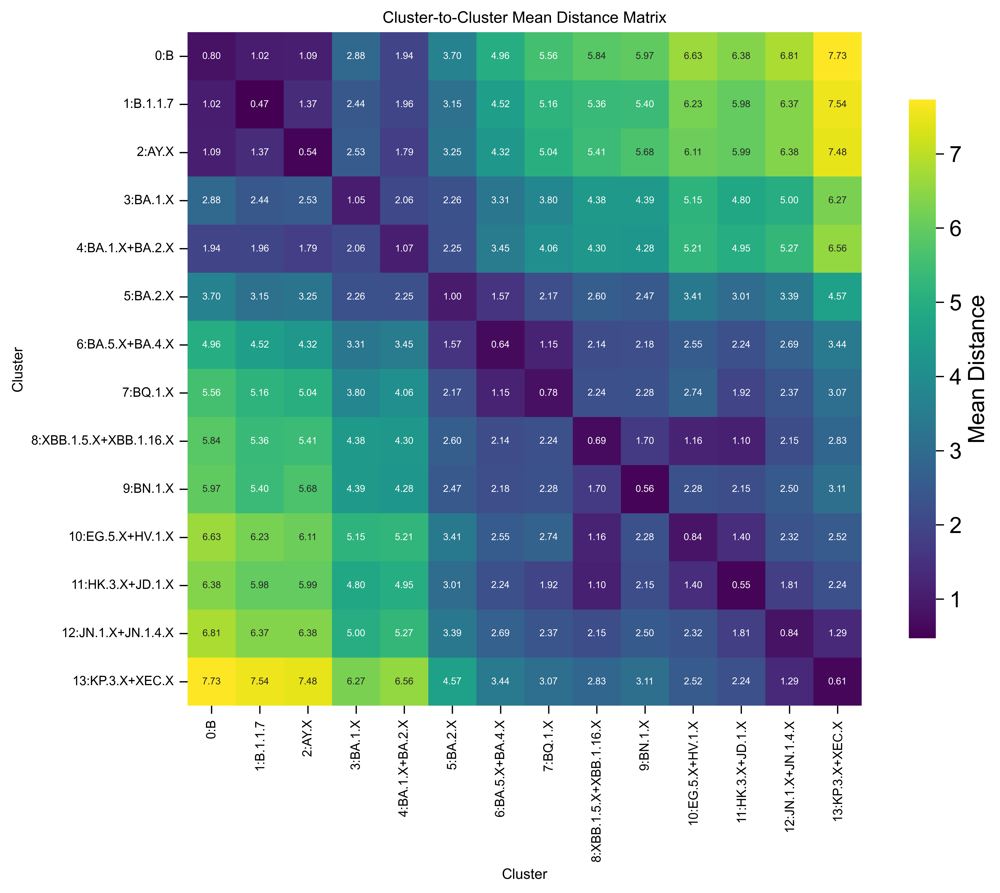

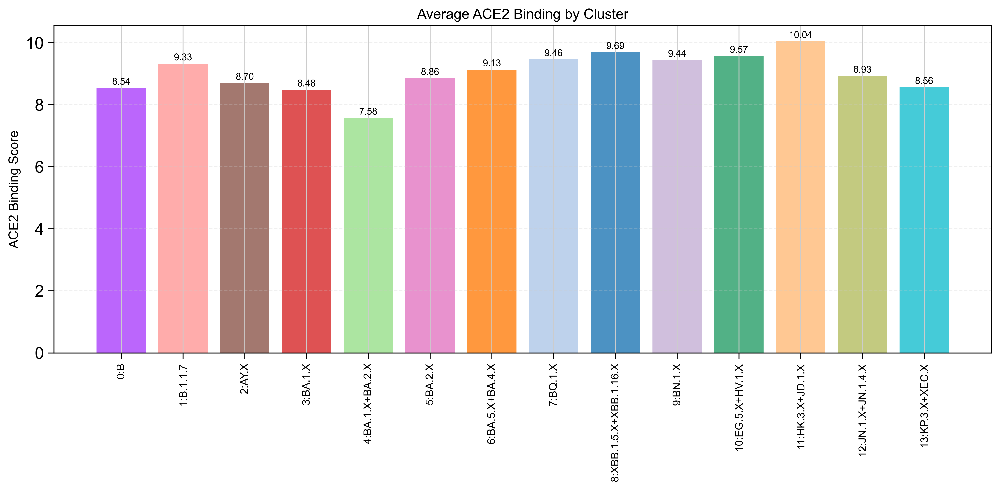

In [14]:
dist_mat = distance_matrix
n_clusters = len(unique_labels)

cluster_dist_mat = np.zeros((n_clusters, n_clusters))
for i, lab_i in enumerate(unique_labels):
    idx_i = np.where(labels == lab_i)[0]
    for j, lab_j in enumerate(unique_labels):
        idx_j = np.where(labels == lab_j)[0]
        if i == j:
            d = dist_mat[np.ix_(idx_i, idx_i)]
            mask = ~np.eye(len(idx_i), dtype=bool)
            cluster_dist_mat[i, j] = d[mask].mean() if len(idx_i) > 1 else 0.0
        else:
            cluster_dist_mat[i, j] = dist_mat[np.ix_(idx_i, idx_j)].mean()

cluster_dist_df = pd.DataFrame(
    cluster_dist_mat,
    index=unique_labels,
    columns=unique_labels
)
cluster_dist_df.to_csv('./data/cluster_mean_distance_matrix.csv', index=True)

binding_df = adata.obs[[cluster_col, ace2_col]].copy()
binding_means = (
    binding_df
    .groupby(cluster_col)[ace2_col]
    .mean()
    .reindex(unique_labels)
    .reset_index()
)
binding_means.to_csv('./data/binding_average_per_cluster.csv', index=False)

# Export cluster colors in the same order as unique_labels
rep_lineage_cat = adata.obs['Representative lineage'].astype('category')
category_order = list(rep_lineage_cat.cat.categories)
category_to_color = dict(zip(category_order, adata.uns['Representative lineage_colors']))

ordered_colors = [category_to_color[label] for label in unique_labels]

color_df = pd.DataFrame({
    'Representative lineage': unique_labels,
    'Color': ordered_colors
})
color_df.to_csv('./data/cluster_colors.csv', index=False)

c_ad = 8.0706

plt.figure(figsize=(10, 8))
ax = sns.heatmap(
    cluster_dist_df * c_ad,
    annot=True,
    fmt='.2f',
    cmap='viridis',
    linewidths=0,
    linecolor='none',
    square=True,
    cbar_kws={'label': 'Mean Distance', 'shrink': 0.8},
    annot_kws={'size': 6}
)

ax.grid(False)
plt.title('Cluster-to-Cluster Mean Distance Matrix', fontsize=10)
plt.xlabel('Cluster', fontsize=9)
plt.ylabel('Cluster', fontsize=9)
plt.xticks(fontsize=8, rotation=90)
plt.yticks(fontsize=8, rotation=0)
plt.tight_layout()
plt.show()

binding_data = binding_means.set_index(cluster_col).loc[unique_labels]

if ordered_colors is None or len(ordered_colors) != len(unique_labels):
    colors = None
else:
    colors = ordered_colors

plt.figure(figsize=(12, 6))
bars = plt.bar(
    np.arange(len(unique_labels)),
    binding_data[ace2_col],
    color=colors,
    alpha=0.8
)

for bar in bars:
    height = bar.get_height()
    plt.text(
        bar.get_x() + bar.get_width() / 2.,
        height + 0.05,
        f'{height:.2f}',
        ha='center',
        va='bottom',
        fontsize=8
    )

plt.xticks(np.arange(len(unique_labels)), unique_labels, rotation=90, fontsize=9)
plt.ylabel('ACE2 Binding Score', fontsize=11)
plt.title('Average ACE2 Binding by Cluster', fontsize=12)
plt.grid(axis='y', linestyle='--', alpha=0.3)
plt.tight_layout()
plt.show()


# Phenotypic evolution

In [15]:
distance_WT=distance_matrix[0,:]*c_ad
seqs_count_df = pd.read_parquet('./data/filtered_mutant_counts_whole_world_mix.parquet')
cluster_codes = adata.obs['leiden_reordered'].astype(int).to_numpy()
ace2_binding = adata.obs["ace2_binding"].to_numpy()
cluster_colors = pd.read_csv('./data/cluster_colors.csv')
colors = cluster_colors['Color'].values

## Dynamics of ACE2 binding

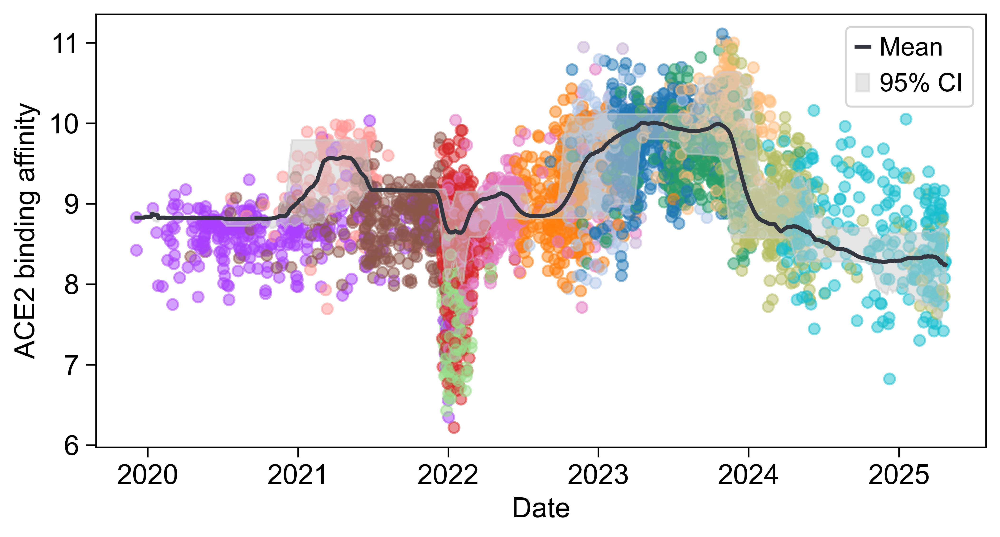

In [16]:
# Extract sequence count data
date = seqs_count_df['Collection date']
seqs_count_array = seqs_count_df.iloc[:, 1:].values
seqs_freq=seqs_count_array/np.sum(seqs_count_array,axis=1,keepdims=True)
max_date=np.argmax(seqs_freq,axis=0)
daily_binding=seqs_freq@ace2_binding
seq_mask_all=np.ones(max_date.shape)
for i,t in enumerate(date):
    seq_ids=np.array(np.where((max_date<i+7) & (max_date>i-7)))
    if seq_ids.shape[1]>5:
        bindings=ace2_binding[seq_ids]
        distances=distance_WT[seq_ids]
        dist_q25=np.quantile(distances,0.25)
        dist_q75=np.quantile(distances,0.75)
        dist_IQR=dist_q75-dist_q25
        bind_q25=np.quantile(bindings,0.25)
        bind_q75=np.quantile(bindings,0.75)
        bind_IQR=bind_q75-bind_q25
        seq_mask=(bindings<(bind_q25-1.5*bind_IQR) )| (bindings>(bind_q75+1.5*bind_IQR)) |(distances<(dist_q25-1.5*dist_IQR)) | (distances>(dist_q75+1.5*dist_IQR))
        seq_mask_all[seq_ids[seq_mask]]=0
seq_mask_all=np.array(seq_mask_all,dtype=bool)
q05 = []
q95 = []
for i in range(seqs_freq.shape[0]):
    reps = (seqs_freq[i] * 100).astype(int)     # 把权重频率乘 100 变整数
    expanded = np.repeat(ace2_binding, reps)    # 按频率重复
    q05.append(np.quantile(expanded, 0.05))
    q95.append(np.quantile(expanded, 0.95))
q05 = np.array(q05)
q95 = np.array(q95)
def movavg(x, n=15):
    return pd.Series(x).rolling(n, center=True, min_periods=1).mean().to_numpy()

daily_binding_ma = movavg(daily_binding)
q05_ma = movavg(q05)
q95_ma = movavg(q95)
plt.figure(figsize=(8,4))

# 已有的 scatter
plt.scatter(date[max_date[seq_mask_all]], ace2_binding[seq_mask_all], s=30, c=colors[cluster_codes[seq_mask_all]], alpha=0.5)

# daily binding MA 
plt.plot(date, daily_binding_ma, lw=2, color="#33363F",
         label="Mean")
plt.fill_between(date, q05_ma, q95_ma,
                 color="0.8", alpha=0.5,
                 label="95% CI")
plt.xlabel('Date')
plt.ylabel('ACE2 binding affinity')
plt.legend()
plt.grid(False)
outdir = "./figs"
os.makedirs(outdir, exist_ok=True)
plt.savefig(os.path.join(outdir, "binding_traj.pdf"),
        bbox_inches="tight")
plt.show()

## Dynamics of antigenic distance from wild type

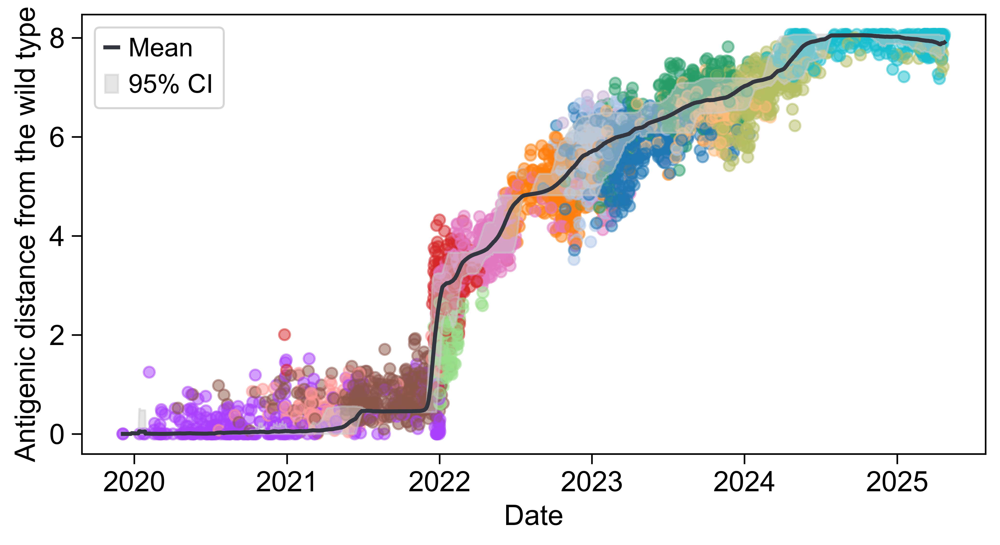

In [17]:
daily_distance=seqs_freq@distance_WT
q05 = []
q95 = []
for i in range(seqs_freq.shape[0]):
    reps = (seqs_freq[i] * 100).astype(int)     # 把权重频率乘 100 变整数
    expanded = np.repeat(distance_WT, reps)    # 按频率重复
    q05.append(np.quantile(expanded, 0.05))
    q95.append(np.quantile(expanded, 0.95))
q05 = np.array(q05)
q95 = np.array(q95)
daily_distance_ma = movavg(daily_distance)
q05_ma = movavg(q05)
q95_ma = movavg(q95)
plt.figure(figsize=(8,4))

# 已有的 scatter
plt.scatter(date[max_date[seq_mask_all]], distance_WT[seq_mask_all], s=30, c=colors[cluster_codes[seq_mask_all]], alpha=0.5)

# daily binding MA 
plt.plot(date, daily_distance_ma, lw=2, color="#33363F",
         label="Mean")
plt.fill_between(date, q05_ma, q95_ma,
                 color="0.8", alpha=0.5,
                 label="95% CI")
plt.xlabel('Date')
plt.ylabel('Antigenic distance from the wild type')
plt.legend()
plt.grid(False)
outdir = "./figs"
os.makedirs(outdir, exist_ok=True)
plt.savefig(os.path.join(outdir, "antigenic_traj.pdf"),
        bbox_inches="tight")
plt.show()

## Neutral simulation of ACE2 binding dynamics

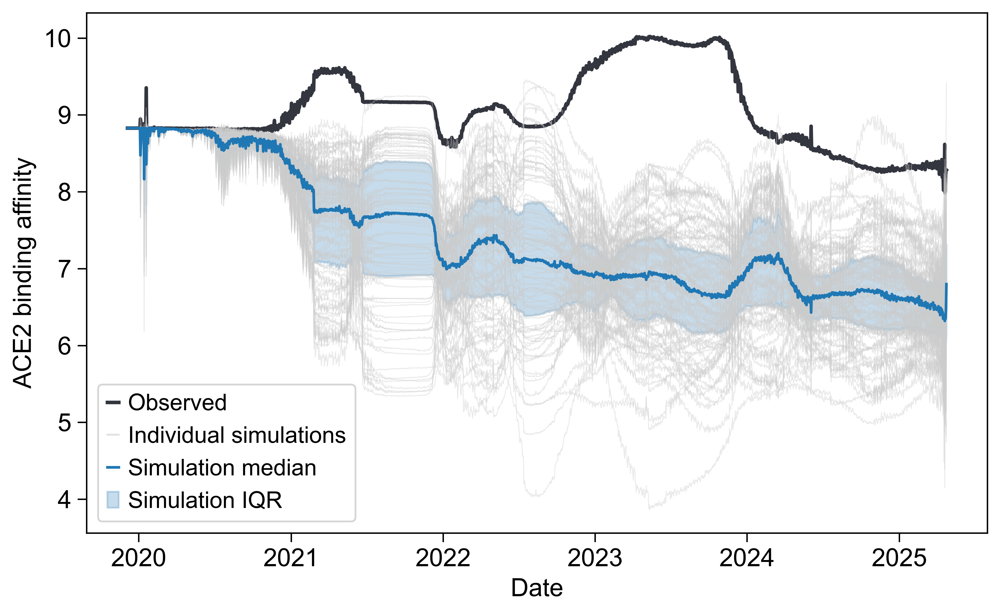

In [18]:
ace2_simu=pd.read_csv('./data/simu_100_pivot_sdJTT.csv')
target_order = adata.obs['mutant_id']
ace2_simu_reordered = (
    ace2_simu
    .set_index('mutant_id')
    .loc[target_order]
    .reset_index()
)
ace2_values = ace2_simu_reordered.iloc[:, 2:].to_numpy()
daily_binding_simu=seqs_freq@ace2_values
plt.figure(figsize=(8, 5))
from matplotlib.lines import Line2D
# 原始曲线
plt.plot(date, daily_binding_simu[:, 0],
         lw=2, color="#33363F", label="Observed")


plt.plot(date, daily_binding_simu[:, 1:], lw=0.5, color="0.8", alpha=0.4)


# median（按行）
simu_median = np.median(daily_binding_simu[:, 1:-1], axis=1)
plt.plot(date, simu_median,
         lw=1.5, color="#1f77b4", label="Simulation median")

# 上下四分位数（按行）
q25 = np.percentile(daily_binding_simu[:, 1:-1], 25, axis=1)
q75 = np.percentile(daily_binding_simu[:, 1:-1], 75, axis=1)

# 画 area
plt.fill_between(
    date,
    q25,
    q75,
    color="#1f77b4",
    alpha=0.25,
    label="Simulation IQR"
)
plt.xlabel('Date')
plt.ylabel('ACE2 binding affinity')
plt.grid(False)
simu_proxy = Line2D([0], [0], color="0.8", lw=1, alpha=0.6, label="Individual simulations")
ax = plt.gca()
handles, labels = ax.get_legend_handles_labels()

# 把代理加进去（比如放在 Observed 后面）
# 你也可以按自己想要的顺序重排
handles.insert(1, simu_proxy)
labels.insert(1, "Individual simulations")

ax.legend(handles, labels, loc="best")

plt.tight_layout()
outdir = "./figs"
os.makedirs(outdir, exist_ok=True)
plt.savefig(os.path.join(outdir, "neutral_simu.pdf"),
        bbox_inches="tight")
plt.show()

# Calculating antigenic cluster dynamics

In [19]:
label_to_idx = {label: i for i, label in enumerate(unique_labels)}

n_obs = adata.n_obs
n_cluster = len(unique_labels)
labels = adata.obs[cluster_col].astype(str).values
one_hot = np.zeros((n_obs, n_cluster), dtype=int)
for i, label in enumerate(labels):
    one_hot[i, label_to_idx[label]] = 1

t0 = 737851
t_end = 739720
deltat = 7
time_obs = np.arange(t0, t_end + deltat, deltat)

date = canada_counts_df['Collection date']
seqs_count_array = canada_counts_df.iloc[:, 1:].values

cluster_count = seqs_count_array @ one_hot
sigma = 33
T = cluster_count.shape[0]
smooth_weight = np.zeros((T, T))
for i in range(T):
    for j in range(T):
        w = np.exp(-(j - i)**4 / (sigma**4))
        smooth_weight[i, j] = w

cluster_count_smooth = smooth_weight @ cluster_count
count_time = pd.to_datetime(date).map(datetime_to_datenum).values
count_obs_ave = []
x_obs_ave = []
n_sum_ave = []
x_obs_smooth = []

for i, t in enumerate(time_obs):
    ind_ave = np.where((count_time > t - 7) & (count_time <= t + 7))[0]
    if len(ind_ave) > 0:
        count_obs_ave_i = cluster_count[ind_ave, :].sum(axis=0)
        count_obs_ave.append(count_obs_ave_i)
        x_obs_ave.append(count_obs_ave_i / count_obs_ave_i.sum())
        n_sum_ave.append(count_obs_ave_i.sum())
    else:
        count_obs_ave.append(np.zeros(cluster_count.shape[1]))
        x_obs_ave.append(np.zeros(cluster_count.shape[1]))
        n_sum_ave.append(0)

n_sum_smooth = []
for i, t in enumerate(time_obs):
    ind_ave = np.where((count_time > t - 1) & (count_time <= t))[0]
    if len(ind_ave) > 0:
        count_obs_smooth_i = cluster_count_smooth[ind_ave, :].sum(axis=0)
        x_obs_smooth.append(count_obs_smooth_i / count_obs_smooth_i.sum())
        n_sum_smooth.append(count_obs_smooth_i.sum())
    else:
        x_obs_smooth.append(np.zeros(cluster_count.shape[1]))
        n_sum_smooth.append(0)

x_obs_ave = np.array(x_obs_ave)
x_obs_smooth = np.array(x_obs_smooth)
n_sum_ave = np.array(n_sum_ave)

birth_index = birth_calculation(x_obs_ave, 0, 2)

Canada_data = {
    'region': 'Canada',
    'dates': time_obs,
    'x_obs_ave': x_obs_ave,
    'x_obs_smooth': x_obs_smooth,
    'n_sum_ave': n_sum_ave,
    'n_sum_smooth': n_sum_smooth,
    'birth_index': birth_index
}

with open('./data/Canada_data.pkl', 'wb') as f:
    pickle.dump(Canada_data, f)
